In [1]:
import sys
sys.path.append('../')

In [2]:


from samrfi import RadioRFI, RFIModels

ms_path = '/home/gpuhost001/ddeal/RFI-AI/one_antenna_3C219_sqrt.ms'
dir_path = '/home/gpuhost001/ddeal/RFI-AI/'

datarfi = RadioRFI(vis=ms_path, dir_path=dir_path)
datarfi.load(mode='DATA', ant_i=1)

datarfi.rfi_antenna_data = datarfi.rfi_antenna_data[0:2, 0:2]

sam_checkpoint = "/home/gpuhost001/ddeal/RFI-AI/models/sam_vit_h_4b8939.pth"
sam_type = "vit_h"

/home/gpuhost001/ddeal/miniconda3/envs/rfi-ai-gpuhost001/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm



Loading data...


100%|██████████| 1/1 [00:16<00:00, 16.70s/it]


(26, 4, 2048, 511)


(2, 2, 2048, 511)
SAMRFI Progress...


100%|██████████| 2/2 [01:06<00:00, 33.42s/it]


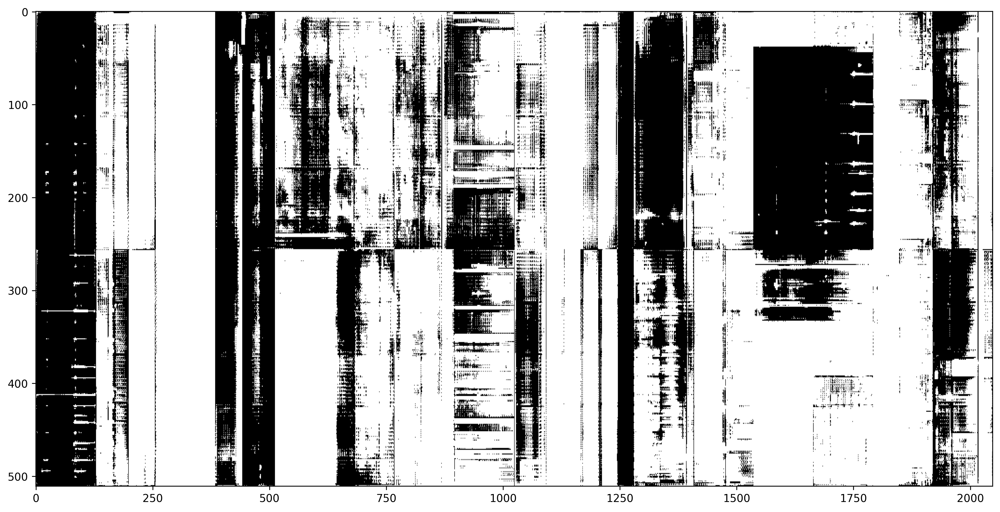

In [8]:
datarfi.rfi_antenna_data = datarfi.rfi_antenna_data[0:2, 0:2]
model_path = "/home/gpuhost001/ddeal/RFI-AI/samrfi_data/models_30/synthetic_256_29_1.pth"
model = RFIModels(sam_checkpoint, sam_type, radiorfi_instance=datarfi, device='cuda',)
model.load_model(model_path)
model.run_rfi_model(patch_run=True, threshold=0.5)

datarfi.plotter.plot(mode='FLAG', baseline=0, polarization=0)

In [9]:
datarfi.rfi_antenna_data = datarfi.rfi_antenna_data[0:2, 0:2]
model_path = "/home/gpuhost001/ddeal/RFI-AI/samrfi_data/models_30/model_stretch-LOG10_sigma-5_patch-patchify_size-256_sam-huge_epochs60_20240930_020131.pth"
model = RFIModels(sam_checkpoint, sam_type, radiorfi_instance=datarfi, device='cuda',)
model.load_model(model_path)
model.run_rfi_model(patch_run=True, threshold=0.5)

(2, 2, 2048, 511)
SAMRFI Progress...


100%|██████████| 2/2 [01:08<00:00, 34.32s/it]


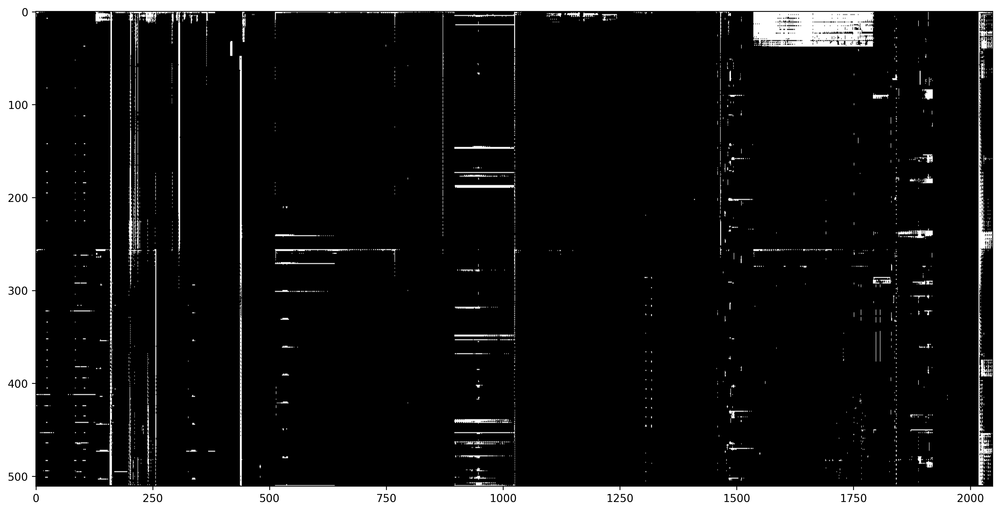

In [10]:
datarfi.plotter.plot(mode='FLAG', baseline=0, polarization=0)

In [11]:
datarfi.rfi_antenna_data = datarfi.rfi_antenna_data[0:2, 0:2]
model_path = "/home/gpuhost001/ddeal/RFI-AI/samrfi_data/models_30/model_stretch-SQRT_sigma-5_patch-patchify_size-256_sam-huge_epochs60_20240929_214113.pth"
model = RFIModels(sam_checkpoint, sam_type, radiorfi_instance=datarfi, device='cuda',)
model.load_model(model_path)
model.run_rfi_model(patch_run=True, threshold=0.5)

(2, 2, 2048, 511)
SAMRFI Progress...


100%|██████████| 2/2 [01:09<00:00, 34.82s/it]


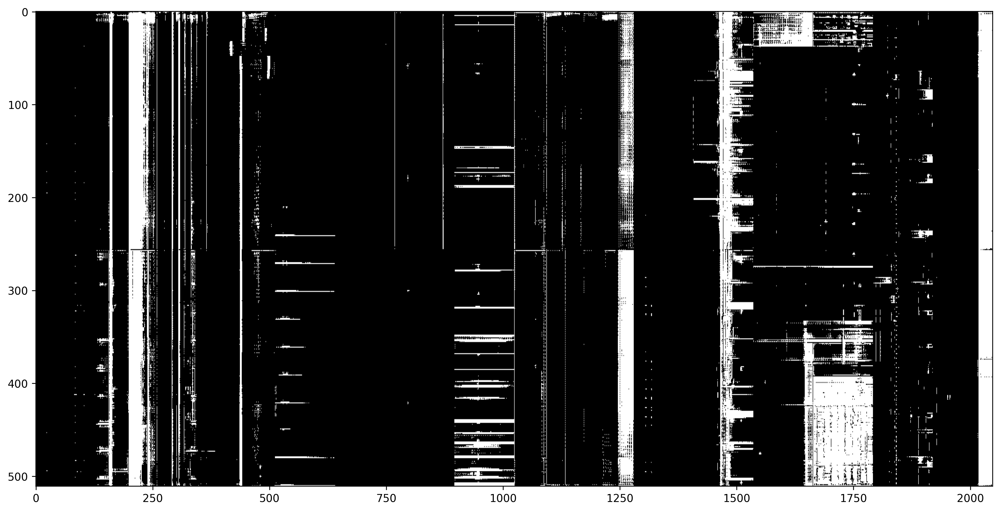

In [12]:
datarfi.plotter.plot(mode='FLAG', baseline=0, polarization=0)

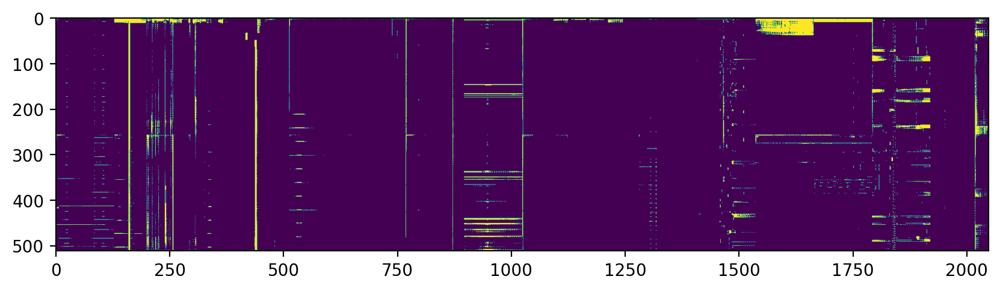

In [17]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(10,5),dpi=200)
ax.imshow(datarfi.flags[0,1].T)

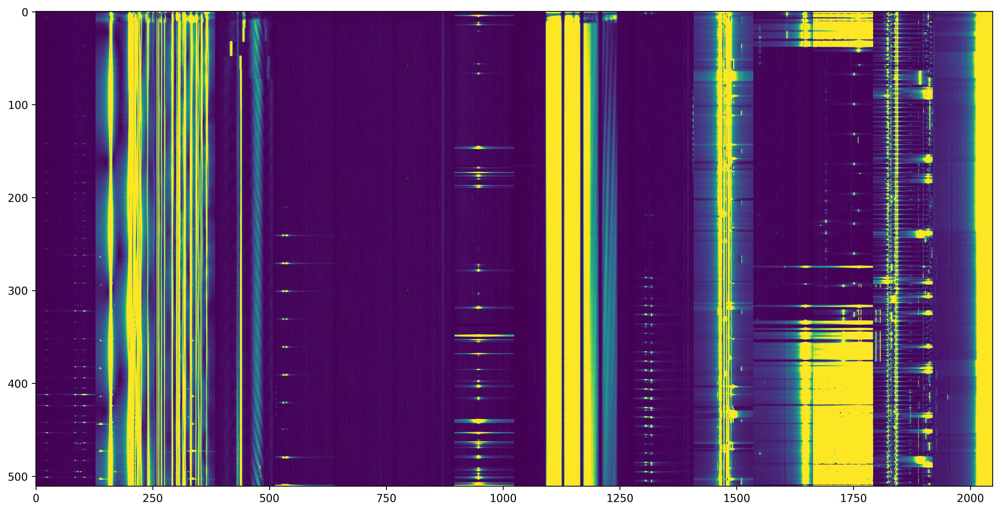

In [5]:
datarfi.plotter.plot(mode='DATA', baseline=0, polarization=0)

In [4]:
datarfi.create_residuals()

In [8]:
datarfi.rfi_antenna_data = datarfi.residuals

(2, 2, 2048, 511)
SAMRFI Progress...


100%|██████████| 2/2 [01:07<00:00, 33.96s/it]


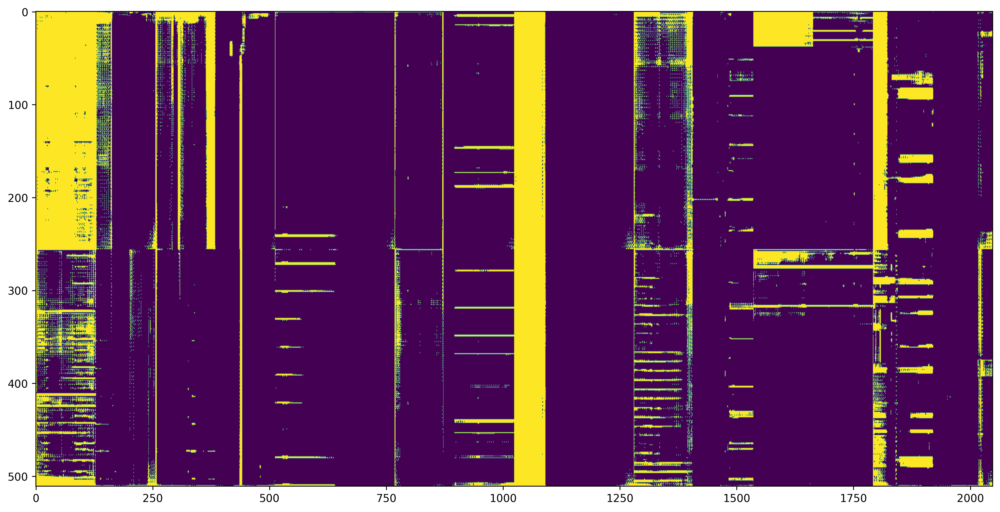

: 

In [8]:
model_path = "/home/gpuhost001/ddeal/RFI-AI/samrfi_data/models/model_stretch-LOG10_sigma-5_patch-patchify_size-256_sam-huge_epochs5_20240929_180748.pth"
model = RFIModels(sam_checkpoint, sam_type, radiorfi_instance=datarfi, device='cuda',)
model.load_model(model_path)
model.run_rfi_model(patch_run=True, threshold=0.3)

datarfi.plotter.plot(mode='FLAG', baseline=0, polarization=0)

---

In [3]:
from samrfi import RFITraining, RadioRFI

/home/gpuhost001/ddeal/miniconda3/envs/rfi-ai-gpuhost001/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [33]:
dir_path = '/home/gpuhost001/ddeal/RFI-AI/'

original_calib = '/home/gpuhost001/ddeal/RFI-AI/original_calib/calib_phase.ms'

datarfi_original = RadioRFI(vis=original_calib, dir_path=dir_path)
datarfi_original.load(mode='DATA', ant_i=1) # using first antenna data

reflected_part = np.flip(datarfi_original.rfi_antenna_data, axis=-1)  # Alternatively, use arr[..., ::-1]
# Step 2: Concatenate along the last axis
new_arr = np.concatenate((datarfi_original.rfi_antenna_data, reflected_part), axis=-1)

datarfi_original.rfi_antenna_data = new_arr

calib_phase_ori = RFITraining(datarfi_original, device='cuda')
calib_phase_ori.train(num_epochs=2, stretch='SQRT', num_patches=20, flag_sigma=5, patch_size=256)


Loading data...


  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:42<00:00, 42.67s/it]


(26, 4, 2048, 196)

Applying median normalization only to 3328 patches...


100%|██████████| 3328/3328 [00:03<00:00, 1085.10it/s]



Applying SQRT stretch and normalization to 3328 patches...


100%|██████████| 3328/3328 [00:09<00:00, 367.00it/s]



Creating sigma 5 flags for each data patch...


100%|██████████| 3328/3328 [00:07<00:00, 422.49it/s]


(3308, 256, 256) (3308, 256, 256)

Training model...


100%|██████████| 5/5 [00:19<00:00,  3.97s/it]


EPOCH: 0
Mean loss: 2.8954460620880127


100%|██████████| 5/5 [00:20<00:00,  4.01s/it]


EPOCH: 1
Mean loss: 2.1928375482559206


RuntimeError: [enforce fail at inline_container.cc:603] . unexpected pos 552556800 vs 552556624

: 

In [16]:
calib_phase_ori.patched_flags.shape

(20, 128, 128)

In [22]:
import numpy as np

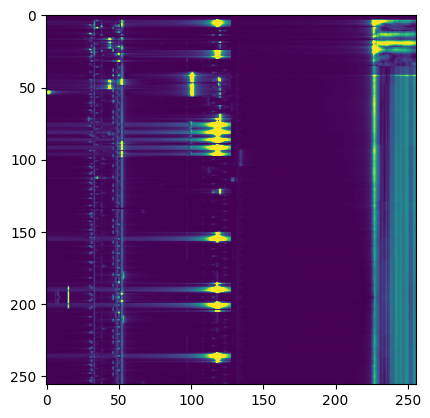

In [32]:
import matplotlib.pyplot as plt


plt.imshow(calib_phase_ori.patched_data_norm_only[0,:,:], vmin=0,vmax=100)

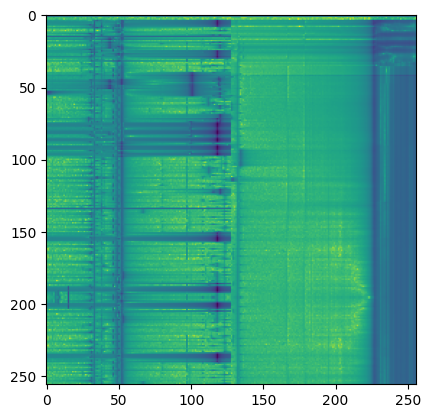

In [30]:
plt.imshow(calib_phase_ori.patched_data[0,:,:])

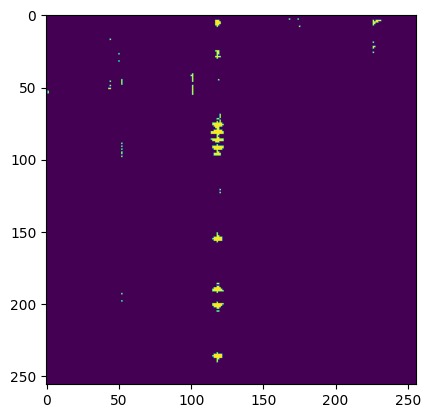

In [29]:
plt.imshow(calib_phase_ori.patched_flags[0,:,:])

/tmp/ipykernel_2115455/3505332652.py:1: RuntimeWarning: divide by zero encountered in log10
  plt.imshow(np.log10(datarfi.rfi_antenna_data[0,0].T))


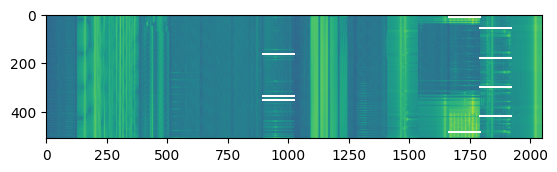

In [51]:
plt.imshow(np.log10(datarfi.rfi_antenna_data[0,0].T))